Abstract
====

Film grain is an important concept in graphic design, video production and photography that can help take the digital "edge" off of a scene. SLR's like the Canon Mark III and RED's EPIC camera are producing footage and stills at such high resolution and clarity, that it is often necessary for professinoals to add more life like elements to the scene in post production. In video in particular, by adding film grain to a scene you can achieve an effect that brings life-like motion back to the viewers eye, even though they still see a seemingly crystal clear picture. 

Introduction
=======

This report will attempt to re-create the Photoshop Noise filter using Python. Photoshop's Noise filter is a great starting point for adding a film-grain like effect to an image or video. In video it is important to to have some randomness in the filter so each frame in a scene gets a slightly different amount of noise, bringing an added life-like motion to the viewer. For the sake of this assignment, we will write a filter that can be applied to a single image, and then discusss how this function could be modified to handle a stream of video.

Methods
====

Below we will analyze the color and black-white versions of an image taken in a well lit bar. The image is of a bloody marry drink which was chosen for it's similarity to common pictures on networks like Instagram and Facebook. We will begin by importing common libraries for image processing and setting up our images for remainder of this report. We will then look at histogram and channel data for both the color and black and white version of the image.

#### Setup

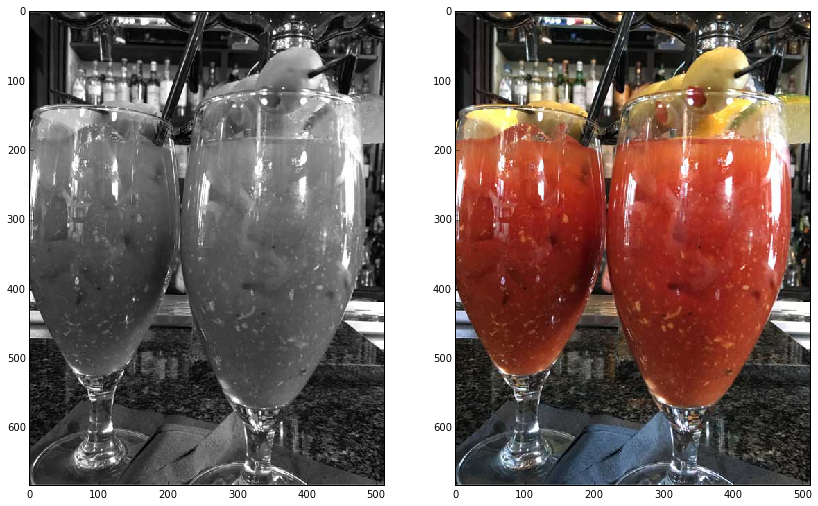

In [122]:
# Dependencies
%matplotlib inline
import random as random
import matplotlib.pyplot as plt

# Set defaults
plt.rcParams['image.cmap'] = 'gray'
plt.rcParams['image.interpolation'] = 'none'
plt.rcParams['figure.figsize'] = 14, 14

# Import images
imgpaths = glob.glob('./images/*.jpg')
imgset = [img_as_ubyte(mpimg.imread(x)) for x in imgpaths]

# Import photoshop results
resultpaths = glob.glob('./photoshop/*.jpg')
resultset = [img_as_ubyte(mpimg.imread(x)) for x in resultpaths]

# Display thumbnails of the images to ensure loading
plt.figure()
for i,img in enumerate(imgset):
    plt.subplot(1, len(imgset), i+1)
    plt.imshow(img, cmap = 'gray')

#### Historgram

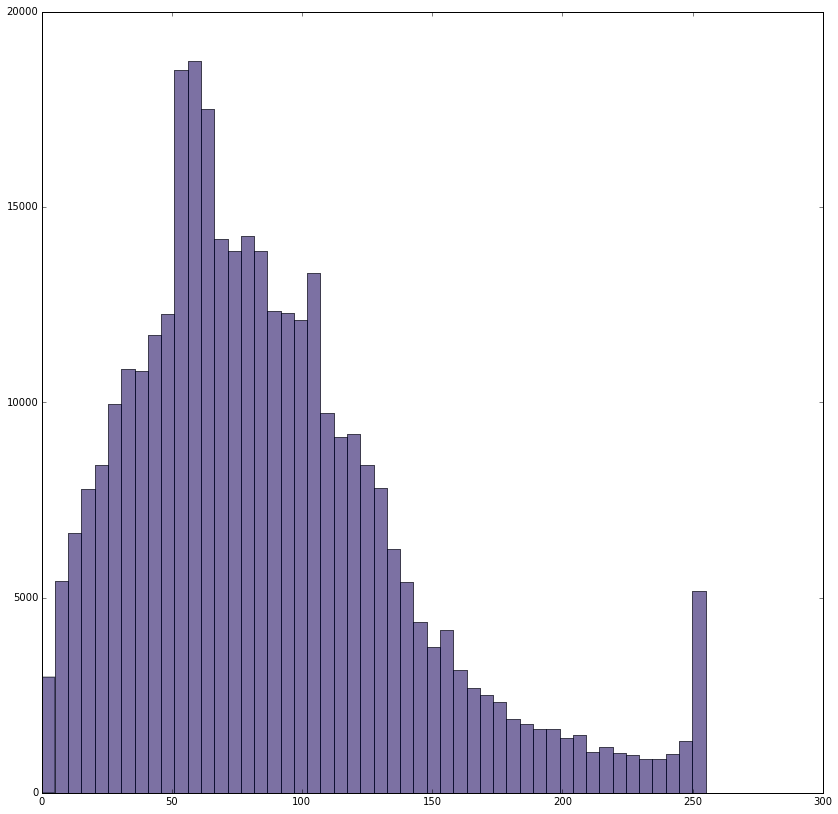

In [43]:
for col, channel in zip('rgb',np.rollaxis(imgset[0],axis=-1)):
    plt.hist(channel.flatten(), bins=50, color=col,alpha=0.3)

#### Color Channels

In [44]:
# Plots a histogram of the image, splitting into individual channels if necessary.
def plot_multichannel_histo(img):
    if img.ndim == 2: # plot grayscale histo
        plt.hist(img.flatten(), 256,  range=(0,255), color='k', histtype='step')
    elif img.ndim == 3: # print rgb histo
        plt.hist(img.reshape(-1,3), 256,  range=(0,255), color=['r','g','b'],histtype='step')
    else: # Not an image
        print("Must pass a valid RGB or grayscale image")
    plt.xlim([0,255])

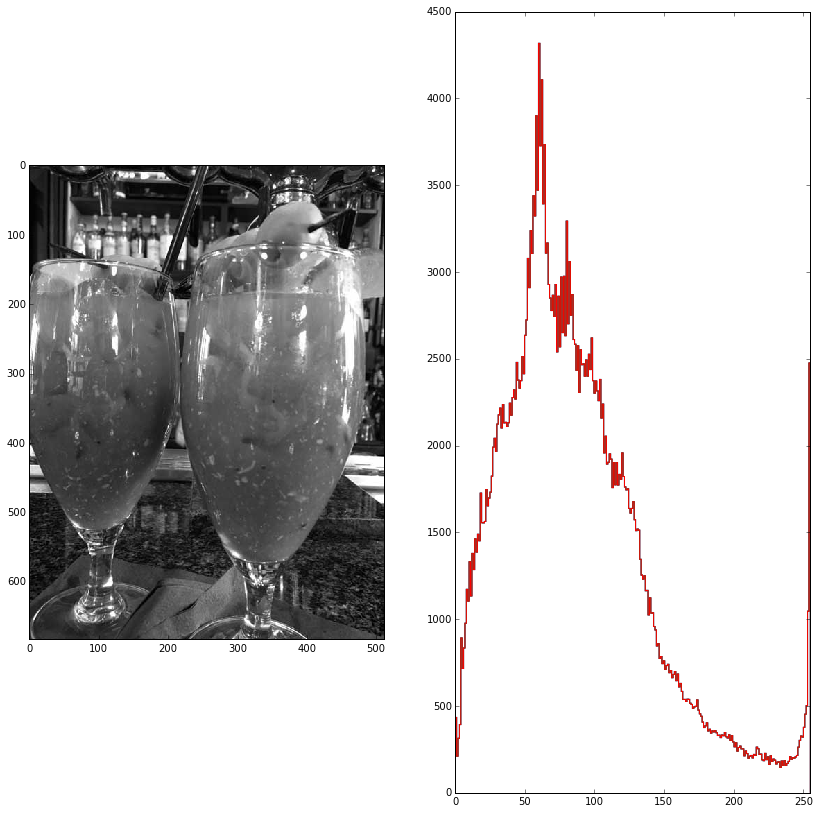

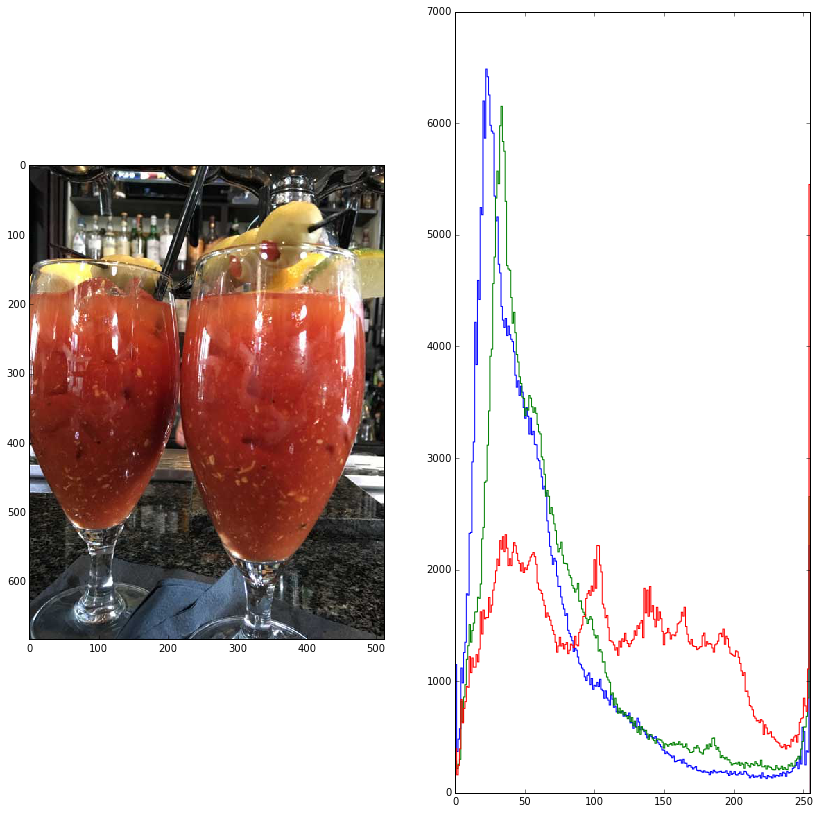

In [45]:
# Apply to image set
for i,img in enumerate(imgset):
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.subplot(1, 2, 2)
    plot_multichannel_histo(img)

Code
===

Below we will define a single function `add_noise` which takes in a single, a float representing the amount of noise to add (between 0 and 1) and optional boolean, monochromatic, to only apply black and white noise.

In [144]:
def add_noise(img, amount, monochromatic=False):
    img = img.copy()
    
    # Iterate rows
    for x, row in enumerate(img):
        
        # Iterate columns
        for y, pixel in enumerate(row):
            
            # generate a random RGB pixel
            new_pixel = [random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)]
            
            # if monochromatic, make RGB same value
            if monochromatic:
                new_pixel = [new_pixel[0], new_pixel[0], new_pixel[0]]
            
            # compute a weighted avergae for each RGB value based on passed in amount
            for i in [0,1,2]:
                old = pixel[i] * (1 - amount)
                new = new_pixel[i] * amount
                img[x][y][i] = old + new
    
    return img

In [118]:
def plot(img, result=-1):
    plt.figure()
    
    # img
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap = 'gray')
    
    # photoshop result
    if result >= 0:
        plt.subplot(1, 2, 2)
        plt.imshow(resultset[result], cmap = 'gray')

Results
====

Below we will analyze results by applying our `add_noise` function to both the color and black-white version of our image. We will experiement with different noise amounts and the monochromatic option. For each trial, the image on the left is the original image with my function and options applied to it. On the right is the original image with the photoshop filter and same options applied to it.

#### Color

In [48]:
color_img = imgset[1]

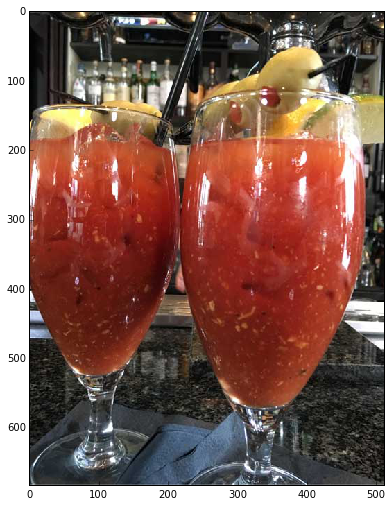

In [123]:
# No noise, should plot as-is
plot(add_noise(color_img, 0.0))

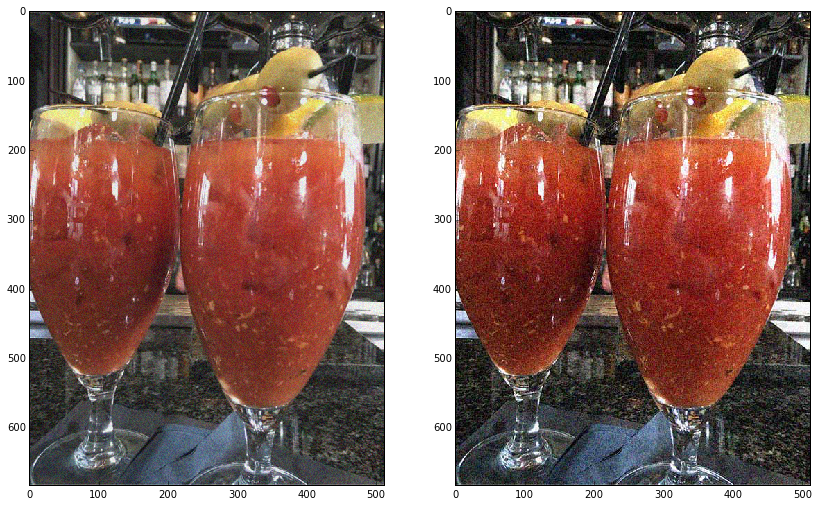

In [145]:
# 15% noise
plot(add_noise(color_img, 0.15), 0)

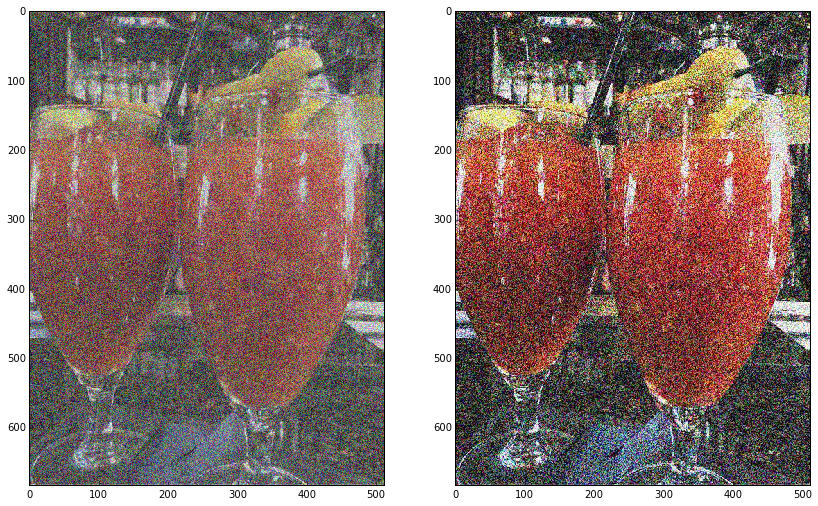

In [129]:
# 50% noise
plot(add_noise(color_img, 0.50), 1)

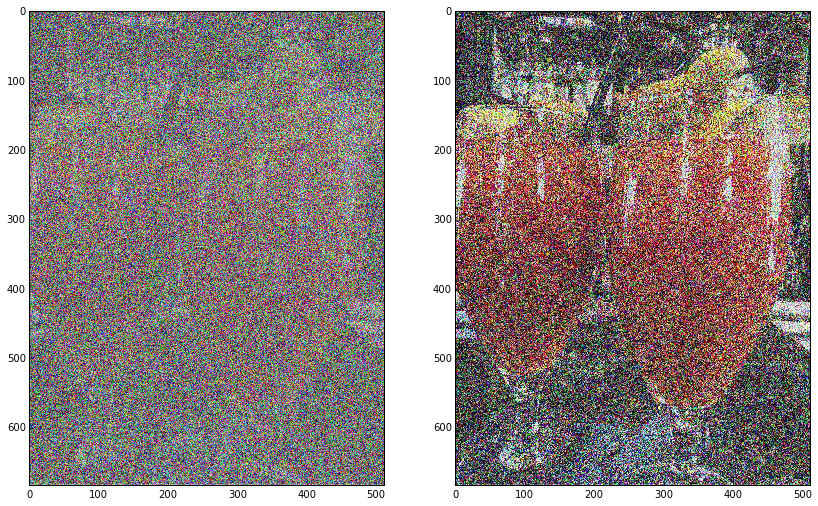

In [130]:
# 85% noise
plot(add_noise(color_img, 0.85), 2)

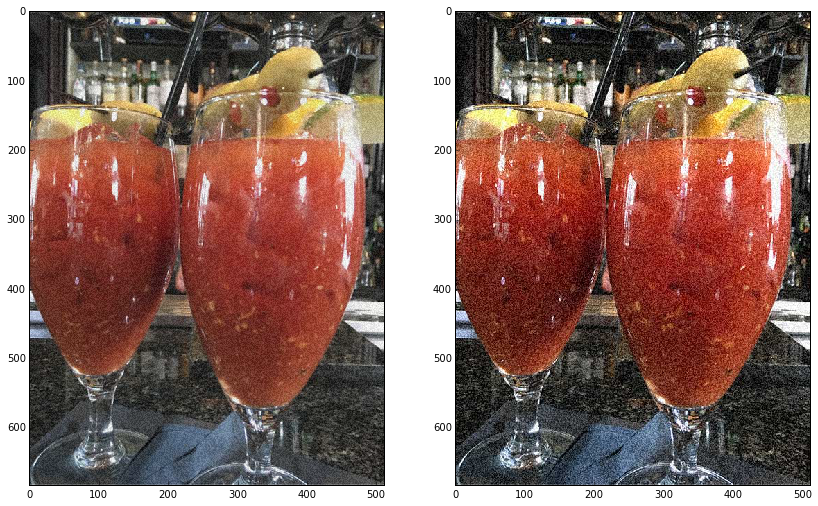

In [131]:
# 15% noise, monochromatic
plot(add_noise(color_img, 0.15, monochromatic=True), 3)

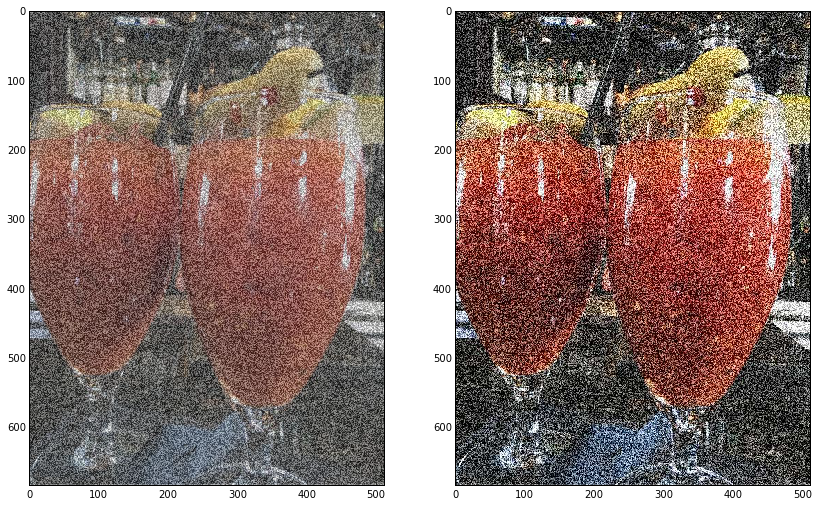

In [132]:
# 50% noise, monochromatic
plot(add_noise(color_img, 0.50, monochromatic=True), 4)

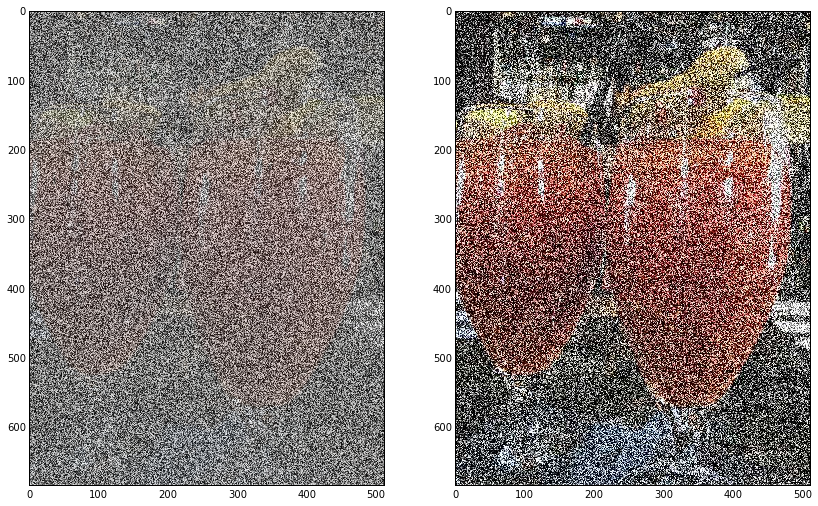

In [133]:
# 85% noise, monochromatic
plot(add_noise(color_img, 0.85, monochromatic=True), 5)

#### Black / White

In [134]:
bw_img = imgset[0]

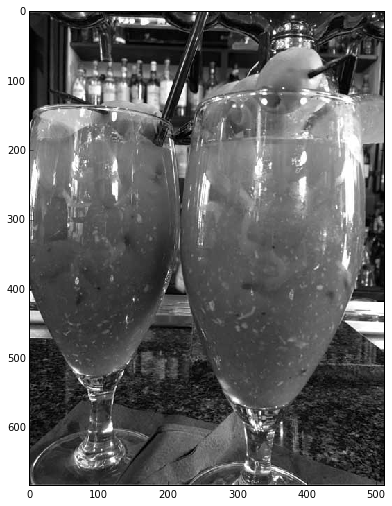

In [135]:
# No noise, should plot as-is
plot(add_noise(bw_img, 0.0, monochromatic=True))

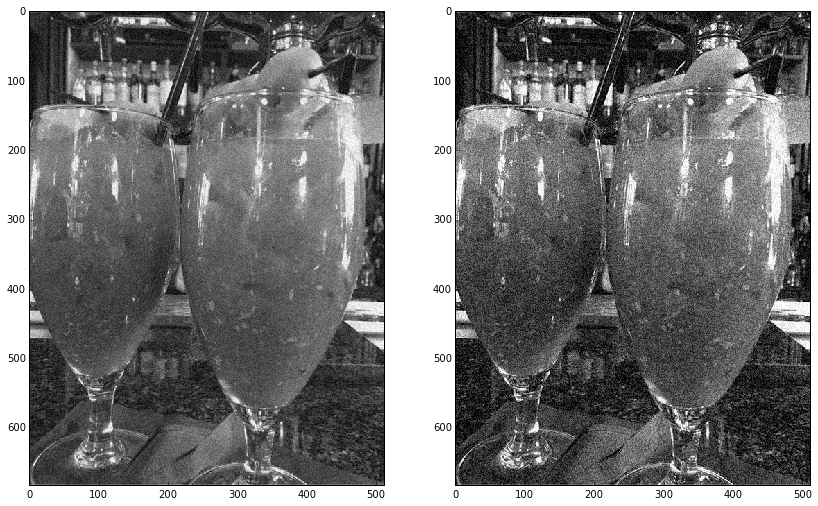

In [136]:
# 15% noise
plot(add_noise(bw_img, 0.15, monochromatic=True), 6)

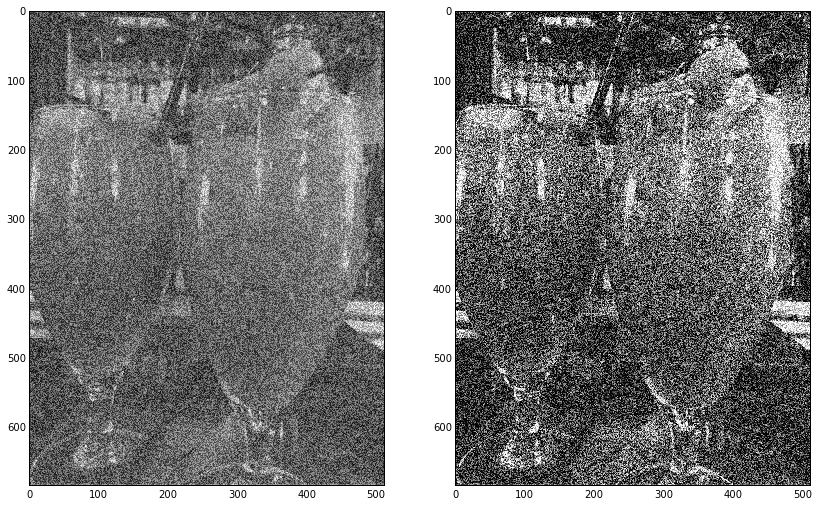

In [137]:
# 50% noise
plot(add_noise(bw_img, 0.50, monochromatic=True), 7)

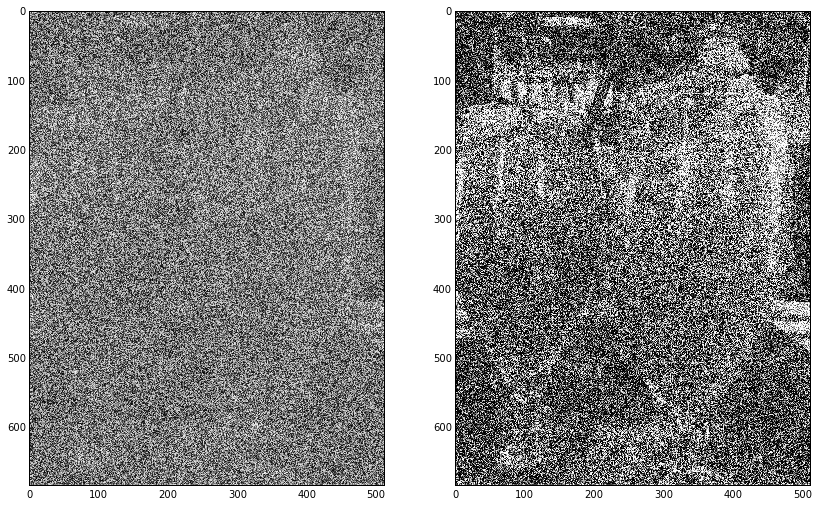

In [138]:
# 85% noise
plot(add_noise(bw_img, 0.85, monochromatic=True), 8)

Discussion
======

It needs to be stated that I did not do any research on how the existing Noise filter works for Photoshop, I simply decided to reverse engineer it myself by trying different combinations of the filter in Adobo Photoshop CC 2015. When I first approached the problem, I knew that I needed to loop through the image pixel by pixel but I wasn't sure how to decide if a pixel should become noise or not. I took a naive apprach at first, generating a random number between 0 and 1, and if that number was greater than the amount passed in, then I would create a random RGB pixel in place of the pixel I was currently on. This essentially created noise in 15%, 50%, 85%... of the image. After looking at the results I knew I could do better, the noise was too sharp, not life like.

My second appraoch was take on the first approach, but instead of just creating a random RGB pixel, I decided to blend it with the current pixel by taking the average of the existing R, G, and B values with the random R, G and B values. This created a more life like image, but was still far off the results that Photoshop was producing.

Knowing that I could create a more life like result by blending the pixels, I decided to try a third approach. In the Photoshop results, it became clear to me that there was noise consistently throughout the picture, regardless of the amount passed in. The difference was how apparent the noise was. Now understanding this, I decided to create noise for every pixel but used the amount passed in to create a weighted average between the original pixel and the new random pixel. The weighted average would put more weight on the original pixel if the amount was <= 0.5 and more weight on the random pixel if the amount was > 0.5. Much to my surprise, this very similar images to the Photoshop results, with the exception that mine were more washed out, leaning heavier on a whiter pixel.  

Finally, I wanted to add the option for creating monochromatic noise, instead of all color noise. This was a very simple afjustment in the function, simply checking for the passed in argument and making the R, G and B values in the new pixel the same number to achieve a gray scale. This also produced similar results to the Photoshop noise with the monochromatic option selected. Again, my results were brighter and more washed out then Photoshop's meaning the Adobe is adjusting their algorithm based on the on bright or dark the image is. My approach is much more naive, simply creating random pixels for each iteration.

References
======

#### 4k Film Grain - A public experiment
[http://www.cineticstudios.com/blog/2015/3/4k-film-grain-a-public-experiment-with-free-stock-footage.html](http://www.cineticstudios.com/blog/2015/3/4k-film-grain-a-public-experiment-with-free-stock-footage.html)